# Homework 2 - How do Taxis move in NYC? 
In this assignment we perform an analysis of Taxis in NYC. In particular, we are curious to answer to some specific *research questions* (__RQs__) that may help Taxi drivers in planning their movements throughout the city and the Taxi's users to have hints about the convenience of enjoying this service.

For this purpose we use the open data of Taxi's trips in NYC. In order to answer to the *RQs* we take into account the data related to Yellow cab for the year 2018, we also tried to analyze data for the year 2017.

# RQ's 

The chunks below are for the normal requests. Before each chunk we will briefly explain our hypothesis and what we want to do. After it we will write our conclusions and the insights gathered from the analysis 

## Libraries

In [138]:
import pandas as pd
import pickle
import scipy.stats as stat
from scipy.stats import pearsonr
from datetime import datetime
from collections import Counter
import itertools as it
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import json
import matplotlib
import warnings
import statsmodels as sm
import numpy as np 
matplotlib.style.use('ggplot') #nice plots
%matplotlib inline

In [2]:
df = pd.DataFrame()
for month in ['01']:#,'02','03','04','05','06']:
    with open("/Users/ince/Desktop/uni/adm/hws/hw2/taxi-2018-"+month, "rb") as f:
        df = df.append(pickle.load(f))
        
        
df.rename(columns={'PULocationID':'LocationID'}, inplace=True)
df['tpep_pickup_datetime'] = pd.to_datetime(df['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S')
df['tpep_dropoff_datetime'] = pd.to_datetime(df['tpep_dropoff_datetime'], format='%Y-%m-%d %H:%M:%S')

### RQ1

In what period of the year Taxis are used more? Create a plot that, for each month, shows the average number of trips recorded each day. Due to the differences among New York zones, we want to visualize the same information for each boroughs. Do you notice any difference among them? Provide comments and plausible explanations about what you observe (e.g.: what is the month with the highest daily average?).

#### HPs: 
We are interest in the pickups instead of the dropoff, so we use only the '__tpep_pickup_datetime__' column for our analysis and '__PULocationID__' for join the dataset with a mapping between the ID's and the associated borough. <br>

The initial columns are:

__tpep_pickup_datetime__ Contains the exactly timestamp in standard %Y-%m-%d %H:%M:%S format. <br>

__PULocationID__ Is an unique id of the location, this will be used for join the dataframe which contain the boroughs.



The resulting dataframe is composed by two columns: one contains the timestamp of the pickup and the other contains the borough in which the pickup happen.

In [4]:
df1 = df[['tpep_pickup_datetime', 'LocationID']]
zone_lookup = pd.read_csv("/Users/ince/Desktop/uni/adm/hws/hw2/taxi_zone_lookup.csv") # this dataset have a map between the LocationID and Borough
df1 = df1.merge(zone_lookup[['LocationID', 'Borough']], how='inner' ,on='LocationID') #Inner join between the interested columns and the previous dataset
df1 = df1[['tpep_pickup_datetime', 'Borough']]
df1 = df1.loc[df['tpep_pickup_datetime'].dt.year == 2018].fillna(0)
display(df1.head())
display(df1.info(null_counts=True))
display(df1.describe())

,tpep_pickup_datetime,Borough
0,2018-01-01 00:21:05,Manhattan
1,2018-01-01 00:49:32,Manhattan
2,2018-01-01 00:11:56,Manhattan
3,2018-01-01 00:58:32,Manhattan
4,2018-01-01 00:14:09,Manhattan


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8759609 entries, 0 to 8759873
Data columns (total 2 columns):
tpep_pickup_datetime    8759609 non-null datetime64[ns]
Borough                 8759609 non-null object
dtypes: datetime64[ns](1), object(1)
memory usage: 200.5+ MB


None

,tpep_pickup_datetime,Borough
count,8759609,8759609
unique,2311234,7
top,2018-01-27 15:15:26,Manhattan
freq,41,7965469
first,2018-01-01 00:00:00,NaN
last,2018-07-27 04:06:37,NaN


After the chunk, we have the cleaned data, so we can run our operations on that!

__Data Engineering:__ For each operation we've performed here is an expaination of why we performed that operation. <br> <br>
__Nested loop:__ For each borough and for each month we have to divide the number of pickups for the days of the month in order to get the daily average, so with *"set(df['Borough'])"* we have all the boroughs and with *"for i in range(1, max(df['pickup'].dt.month)+1)"* we iterate with all months.

For avoid mistakes we build a list of the days per month in which the element in position 0 corresponds to Janaury, the element in position 1 corresponds to Febraury and so on.

__tmp and tmpdf:__ In the nested for loop there's a temporary data frame that stores the pickups in the month that we're analyzing, we can avoid it but at this moment we prefer readability instead of performances, we'll free the memory each and every time the loop comes over.

We used vectorization because pandas is optimized for vector operations.

In [5]:
df12 = pd.DataFrame()
tmp = pd.Series()
months = [31,28, 31, 30, 31, 30]
for borough in set(df1['Borough']): #
    for i in range(1, max(df1['tpep_pickup_datetime'].dt.month)):
        tmpdf = df1.loc[(df1['tpep_pickup_datetime'].dt.month == i) & (df1['Borough'] == borough)]['tpep_pickup_datetime']
        if len(tmpdf) != 0:
            tmp = tmp.append(pd.Series(tmpdf.count()/months[i-1]), ignore_index=True)
    df12[borough] = tmp
    del tmp
    del tmpdf
    tmp = pd.Series()
df12.rename(index ={0:'Jan', 1:'Feb', 2:'Mar', 3:'Apr', 4:'May', 5:'Jun'}, inplace = True)
df12 = df12.fillna(0)
display(df12)

,Manhattan,Unknown,Brooklyn,Bronx,Staten Island,EWR,Queens
Jan,256948.258065,5125.935484,3233.548387,238.354839,4.645161,18.419355,16996.387097
Feb,2.392857,0.071429,0.000000,0.000000,0.000000,0.000000,0.071429


### Plotting the data

Here is a barplot, that, for ach borough plots the average taxis pickups per month

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x10cb8e5f8>,
      dtype=object)

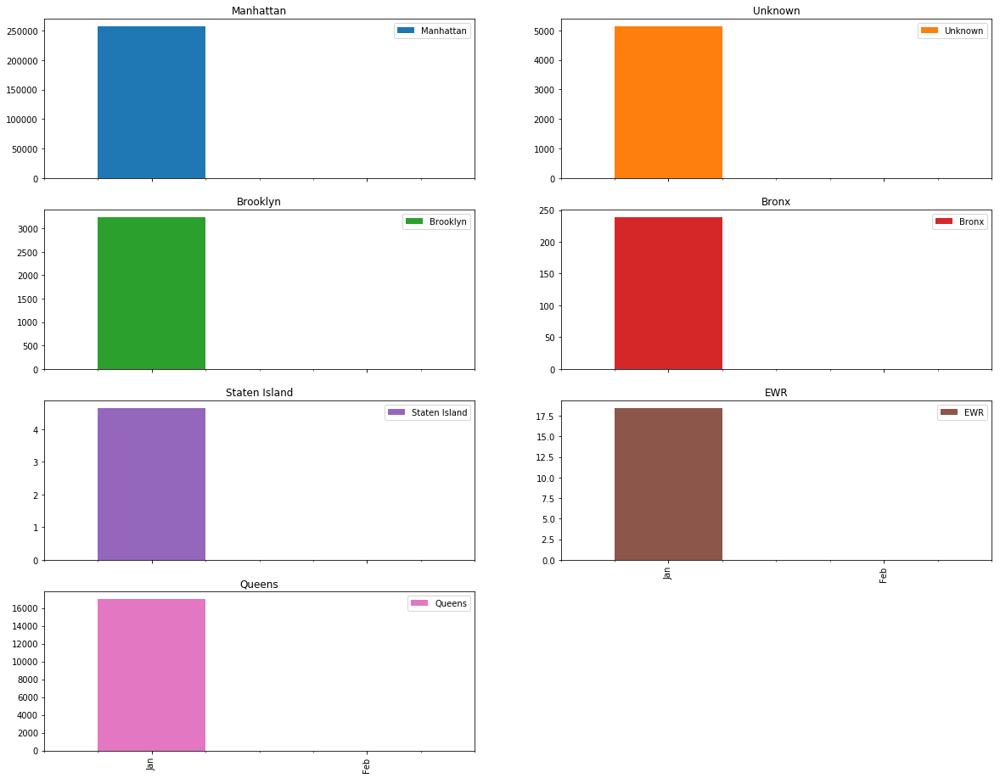

In [6]:
df12.plot.bar(figsize=(20,20),subplots=True,layout=(5,2))

## Conclusions for RQ1
We noticed that Manhattan has a really huge amount of daily average trips, also we observed that the distribution is kind of an [Uniform](https://en.wikipedia.org/wiki/Uniform_distribution_(continuous)) for most of the boroughs.

If we rescale the daily average (otherwise Manhattan will take all the density) we can see that the month with more counts is Janaury. 

With a brief chat with a friend, she told me that Manhattan has this huge amount of yellow taxis with respect of other boroughs because others are covered by green ones.

In [7]:
del df1
del df12

# RQ3

In [114]:
df3 = df[['LocationID', 'DOLocationID']]
df3['duration_min']= round(((df['tpep_dropoff_datetime']-df['tpep_pickup_datetime']).dt.seconds)/60, 1)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [127]:
df3.dropna(inplace=True) 
df3.rename(columns= {'LocationID':'PULocationID'}, inplace=True)
zone_lookup = pd.read_csv("/Users/ince/Desktop/uni/adm/hws/hw2/taxi_zone_lookup.csv") #this dataset has a map btwn LocationID and Borough(ilçe)

#merge df3 and zone_lookup to get pick up borough
trips = df3.merge(zone_lookup[['LocationID', 'Borough']], how='inner',
                      left_on='PULocationID',
                      right_on='LocationID').fillna("")[['duration_min','PULocationID','DOLocationID','Borough']]

trips.rename(columns= {'Borough':'PUBorough'}, inplace=True)

#merge trips and zone_lookup to get drop off borough
trips = trips.merge(zone_lookup[['LocationID', 'Borough']], how='inner',
                      left_on='DOLocationID',
                      right_on='LocationID').fillna("")[['duration_min','PULocationID','DOLocationID','PUBorough','Borough']]

trips.rename(columns= {'Borough':'DOBorough'}, inplace=True)


#take a look trips and try to see if there is weird data
display(trips.head())
trips.describe()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3027: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


,duration_min,PULocationID,DOLocationID,PUBorough,DOBorough
0,3.3,41,24,Manhattan,Manhattan
1,4.9,41,24,Manhattan,Manhattan
2,4.3,41,24,Manhattan,Manhattan
3,6.0,41,24,Manhattan,Manhattan
4,5.1,41,24,Manhattan,Manhattan


,duration_min,PULocationID,DOLocationID
count,8.759874e+06,8.759874e+06,8.759874e+06
mean,1.566104e+01,1.644585e+02,1.627269e+02
std,6.024733e+01,6.636021e+01,7.031164e+01
min,0.000000e+00,1.000000e+00,1.000000e+00
25%,6.200000e+00,1.160000e+02,1.130000e+02
50%,1.040000e+01,1.620000e+02,1.620000e+02
75%,1.680000e+01,2.340000e+02,2.340000e+02
max,1.440000e+03,2.650000e+02,2.650000e+02


In [128]:
trips.drop(trips.index[np.where(trips['duration_min'] <= 0)], inplace=True) #drop if duration of trips is zero or less than zero
trips[trips['duration_min']>1400] #there are some outliers also.



,duration_min,PULocationID,DOLocationID,PUBorough,DOBorough
1599,1435.5,239,24,Manhattan,Manhattan
2241,1434.0,239,24,Manhattan,Manhattan
2371,1438.0,239,24,Manhattan,Manhattan
2398,1426.6,239,24,Manhattan,Manhattan
4572,1433.7,140,24,Manhattan,Manhattan
4856,1431.1,246,24,Manhattan,Manhattan
5053,1436.2,143,24,Manhattan,Manhattan
5542,1437.6,143,24,Manhattan,Manhattan
6155,1437.9,238,24,Manhattan,Manhattan
6910,1429.5,238,24,Manhattan,Manhattan


In [129]:

# set of all boroughs
Boroughs = list(set(zone_lookup['Borough']))
Boroughs[Boroughs.index('Staten Island')] = 'StatenIsland'
del Boroughs[Boroughs.index('Unknown')] 

# split data based on boroughs
Bronx = trips[(trips['PUBorough']==trips['DOBorough']) & (trips['PUBorough']=='Bronx')]['duration_min']
Brooklyn = trips[(trips['PUBorough']==trips['DOBorough']) & (trips['PUBorough']=='Brooklyn')]['duration_min']
EWR = trips[(trips['PUBorough']==trips['DOBorough']) & (trips['PUBorough']=='EWR')]['duration_min']
Manhattan = trips[(trips['PUBorough']==trips['DOBorough']) & (trips['PUBorough']=='Manhattan')]['duration_min']
Queens = trips[(trips['PUBorough']==trips['DOBorough']) & (trips['PUBorough']=='Queens')]['duration_min']
StatenIsland = trips[(trips['PUBorough']==trips['DOBorough']) & (trips['PUBorough']=='StatenIsland')]['duration_min']
SwitchedBorough = trips[trips['PUBorough']!=trips['DOBorough']]['duration_min']
#SwitchedBorough can be specified as finding the most frequest trip among 2 boroughs



'z-score is for normalization. After normalized the data, 99.6 percent of data should be lie \nbetween -3 and 3. In the light of this information, if the some observations are out of that range,\nthey are outliers. '

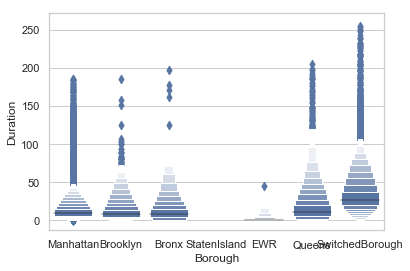

In [134]:
df31 = pd.DataFrame()
for B in Boroughs:
    df32 = eval("pd.DataFrame({'Duration':" + B +",'Borough':['"+str(B)+"']*len("+B+")})")
    df31 = pd.concat([df31, df32])

df31 = pd.concat([df31, pd.DataFrame({'Duration':SwitchedBorough,'Borough':['SwitchedBorough']*len(SwitchedBorough)})])

    
sns.set(style="whitegrid")

sns.boxenplot(x="Borough", y="Duration",
              color="b", order= Boroughs+['SwitchedBorough'],
              scale="linear", data=df31)

"""it can be obviously seen that there are some outliers on data, especially for Manhattan, Bronx, Brooklyn
and Queens. Generally outliers are above 1400 minites. We may ignore them since we have too much data. Also
We can observe the distribution of data more effectively"""


"""z-score is for normalization. After normalized the data, 99.6 percent of data should be lie 
between -3 and 3. In the light of this information, if the some observations are out of that range,
they are outliers. """

In [133]:
#formal check by using z-score

threshold = 3 #the threshold is 3(we'll take absolute of it)

Bronx_z = np.abs(stat.zscore(Bronx))
Bronx.drop(Bronx.index[np.where(Bronx_z > 3)], inplace=True) #np.where(Bronx_z > 3)[0][0] BOŞ KÜME DE OLABİLİR?

Brooklyn_z = np.abs(stat.zscore(Brooklyn))
Brooklyn.drop(Brooklyn.index[np.where(Brooklyn_z > 3)], inplace=True) 

EWR_z = np.abs(stat.zscore(EWR))
EWR.drop(EWR.index[np.where(EWR_z > 3)], inplace=True)

Manhattan_z = np.abs(stat.zscore(Manhattan))
Manhattan.drop(Manhattan.index[np.where(Manhattan_z > 3)], inplace=True)

Queens_z = np.abs(stat.zscore(Queens))
Queens.drop(Queens.index[np.where(Queens_z > 3)], inplace=True)

StatenIsland_z = np.abs(stat.zscore(StatenIsland))
StatenIsland.drop(StatenIsland.index[np.where(StatenIsland_z > 3)], inplace=True)

SwitchedBorough_z = np.abs(stat.zscore(SwitchedBorough))
SwitchedBorough.drop(SwitchedBorough.index[np.where(SwitchedBorough_z > 3)], inplace=True)



/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:2533: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(obj)
/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2247: RuntimeWarning: Mean of empty slice.
  mns = a.mean(axis=axis)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:132: Runtim

In [ ]:
df_wo_outliers = pd.DataFrame()
for B in Boroughs:
    df2 = eval("pd.DataFrame({'Duration':" + B +",'Borough':['"+str(B)+"']*len("+B+")})")
    df_wo_outliers = pd.concat([df_wo_outliers, df2])
df_wo_outliers = pd.concat([df_wo_outliers,
                            pd.DataFrame({'Duration':SwitchedBorough,'Borough':['SwitchedBorough']*len(SwitchedBorough)})])

#check visually again;

sns.set(style="whitegrid")

sns.boxenplot(x="Borough", y="Duration",
              color="b", order= Boroughs+['SwitchedBorough'],
              scale="linear", data=df_wo_outliers)

"""it is more clear now. According to boxplot, Manhattan has the most outliers. Inlike Manhattan, Bronx
has just one outlier. Median of the trip duration is similar for Manhattan, Bronx, Brooklyn and Queens.
Moreover in Manhattan, people tend to make short trips more. SwitchedBorough data spreads more because
generally it takes more time when you travel out of borough. That why it has also many outliers. """



'it is more clear now. According to boxplot, Manhattan has the most outliers. Inlike Manhattan, Bronx\nhas just one outlier. Median of the trip duration is similar for Manhattan, Bronx, Brooklyn and Queens.\nMoreover in Manhattan, people tend to make short trips more. SwitchedBorough data spreads more because\ngenerally it takes more time when you travel out of borough. That why it has also many outliers. '

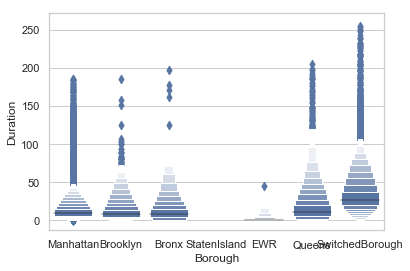

In [135]:
df_wo_outliers = pd.DataFrame()
for B in Boroughs:
    df33 = eval("pd.DataFrame({'Duration':" + B +",'Borough':['"+str(B)+"']*len("+B+")})")
    df_wo_outliers = pd.concat([df_wo_outliers, df33])
df_wo_outliers = pd.concat([df_wo_outliers,
                            pd.DataFrame({'Duration':SwitchedBorough,'Borough':['SwitchedBorough']*len(SwitchedBorough)})])

#check visually again;

sns.set(style="whitegrid")

sns.boxenplot(x="Borough", y="Duration",
              color="b", order= Boroughs+['SwitchedBorough'],
              scale="linear", data=df_wo_outliers)

"""it is more clear now. According to boxplot, Manhattan has the most outliers. Inlike Manhattan, Bronx
has just one outlier. Median of the trip duration is similar for Manhattan, Bronx, Brooklyn and Queens.
Moreover in Manhattan, people tend to make short trips more. SwitchedBorough data spreads more because
generally it takes more time when you travel out of borough. That why it has also many outliers. """

/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:177: UserWarning: The left and right margins cannot be made large enough to accommodate all axes decorations. 
  warnings.warn('The left and right margins cannot be made large '
/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:177: UserWarning: The left and right margins cannot be made large enough to accommodate all axes decorations. 
  warnings.warn('The left and right margins cannot be made large '


'We may guess the which distribution can be good fit to our data but it is just a guess. Based on our\n"instinct", we can check some distribution whether they are similar to our data or not. In order to\nfind that, some error calculation and graphically check will be used'

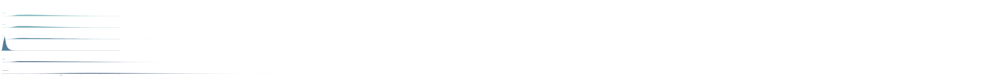

In [145]:
#visiualization for all dist

sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Initialize the FacetGrid object
pal = sns.cubehelix_palette(8, rot=-.25, light=.7) #Make a sequential palette from the cubehelix system. bu renk seçiyo birinden öbürüne geçen bi skala ile
Borough = sns.FacetGrid(df_wo_outliers, row="Borough", hue="Borough", aspect=10, palette=pal,xlim=(0, 30)) #Multi-plot grid for plotting conditional relationships.
#burdaki row ve hue(bi de col var ama bunu kullanmadık burda):Variables that define subsets of the data, which will be drawn on separate facets in the grid. _order komutuyla sırasını belirleyebilirsin istersen
 

# Draw the densities in a few steps

# sns.FacetGrid() açıyosun ilk önce. boş bi zemine şablon oturttuğunu düşün. daha sonra .map() diyince çizdiriyosun detayları verip
#kde plot: Fit and plot a univariate or bivariate kernel density estimate.
Borough.map(sns.kdeplot, "Duration", clip_on=False, shade=True, alpha=1, lw=1.5, bw=.2) 
Borough.map(sns.kdeplot, "Duration", clip_on=False, color="w", lw=2, bw=.2)
Borough.map(plt.axhline, y=0, lw=2, clip_on=False)


# Define and use a simple function to label the plot in axes coordinates--buna gerek yok
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)


Borough.map(label, "Duration")

# Set the subplots to overlap
Borough.fig.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
Borough.set_titles("")
Borough.set(yticks=[])
Borough.despine(bottom=True, left=True)

"""It is good prepreliminary preparation to have an idea about how all distributions look like. """

"""We may guess the which distribution can be good fit to our data but it is just a guess. Based on our
"instinct", we can check some distribution whether they are similar to our data or not. In order to
find that, some error calculation and graphically check will be used"""



In [150]:
"""After deeply understanding the steps,
the source: https://stackoverflow.com/questions/6620471/fitting-empirical-distribution-to-theoretical-ones-with-scipy-python?lq=1
will be used for taking help.

Empirically we'll try to fit some distribution to our data for each boroughs. Then the best parameters'll
find for the specified distribution. Sum of square error(SSE) will be used when the distributions are compared
to eachother. Thus, the distribution with minimum SSE will be the best fit.
"""

# Build a function to find best distribution that fit the data.
def bestDist(data, bins=200):
    # Get histogram of original data, according to number of bins, histogram function will create boundaries for bins based on its width
    y, x = np.histogram(data, bins=bins, density=True)
    x = (x + np.roll(x, -1))[:-1] / 2.0 #since there are 100 bins, we split the bins equally on x axis.
                   
    #in scipy, there are lots of distribution type but in here, we just try basic ones;
    DISTRIBUTIONS = [ stat.beta,stat.cauchy,stat.chi2,stat.expon,stat.exponnorm,stat.gamma,stat.laplace,stat.logistic,
                     stat.lognorm,stat.norm,stat.pareto,stat.rayleigh,stat.uniform ]
            
    # Best holders; just for the inital step, we assign some samples
    best_distribution = stat.norm
    best_params = (0.0, 1.0)
    best_sse = np.inf
        
    # We try all distribution that we wrote above to estimate distribution parameters from our original data
    for dist in DISTRIBUTIONS:
        # Try to fit the distribution
        try:
            # Ignore warnings from data that can't be fit
            with warnings.catch_warnings():
                warnings.filterwarnings('ignore')
        
                # fit dist to data
                prms = dist.fit(data) #fit helps to find best prm.s for the data
        
                #Separate parts of parameters: we split location,scale parameter and arguments if they exist
                arg = prms[:-2]
                loc = prms[-2]
                scale = prms[-1]
        
                """After finding best parameters for the specified distribution, we'll calculate fitted pdf
                and sse(sum of square error)"""
                pdf = dist.pdf(x, loc=loc, scale=scale, *arg) #it generates pdf from x; remember that we generate x from our original data to fit the histogram
                sse = np.sum(np.power(y - pdf, 2)) #sum of square error. this is our decision criteria
                
                # if axis pass in add to plot
                try:
                    if ax:
                        pd.Series(pdf, x).plot(ax=ax)
                    end
                except Exception:
                    pass
        
                # Update best holders for the distribution and its parameters according to sse.
                if best_sse > sse > 0:
                    best_dist = dist
                    best_prms = prms
                    best_sse = sse
        
        except Exception:
            pass
    return (best_dist.name, best_prms)

# Store the best distribution and its parameters, then we'll use them to get pdf
    
def pdf(best_dist, best_prms, size=1000):
    # Separate parts of parameters
    arg = best_prms[:-2]
    loc = best_prms[-2]
    scale = best_prms[-1]

    # Get sane start and end points of distribution
    """ppf:Percent point function (inverse of cdf — percentiles)
       we use start end point to split x axis based on percentiles. 0.001 means it will almost start from
       0th index and it goes until reach almost 100th percentile (0.999 represents that)"""
    #if arg doesn't exist we just use location and scale prm.s, otherwise we use tree of them.
    start = best_dist.ppf(0.001, *arg, loc=loc, scale=scale) if arg else best_dist.ppf(0.001, loc=loc, scale=scale)
    end = best_dist.ppf(0.999, *arg, loc=loc, scale=scale) if arg else best_dist.ppf(0.999, loc=loc, scale=scale)

    # Now we can create pdf
    x = np.linspace(start, end, size) #.linspace() returns evenly spaced numbers over a specified interval
    y = best_dist.pdf(x, loc=loc, scale=scale, *arg) 
    pdf = pd.Series(y, x)
    return pdf

In [151]:

#Let's try it for all boroughs
    
# Manhattan;
Man_best_fit_name, Man_best_fit_prms = bestDist(Manhattan, bins=200)
Man_best_dist = getattr(stat, Man_best_fit_name) #getattr() returns the value of the named attribute of an object

Man_pdf = pdf(Man_best_dist, Man_best_fit_prms)

Man_prm = list(map(lambda x: "%.3f" % x, Man_best_fit_prms)) #for the title round the parameters

#Let's check on histogram and line of pdf
sns.set(style="white", palette="muted", color_codes=True)

fig, ax = plt.subplots()
Man_pdf.plot(lw=2, label='pdf', legend=True, ax=ax)
ax2 = ax.twinx()
sns.distplot(Manhattan, bins=50,kde=False, color="g", ax=ax2)

plt.xlabel(u'Duration (min)')
plt.ylabel("Frequency")
plt.title(u'The best fit distribution for Manhattan\n'+Man_best_fit_name+' with parameters \n' 
          +'('+Man_prm[0]+','+Man_prm[1]+','+Man_prm[2]+')') # You can comment this line out if you don't need title
plt.show(fig)

"""It seems lognormal distribution totally fit the Manhattan taxi travel duration. """



# Bronx
Brnx_best_fit_name, Brnx_best_fit_prms = bestDist(Bronx, bins=100)
Brnx_best_dist = getattr(st, Brnx_best_fit_name) #getattr() returns the value of the named attribute of an object

Brnx_pdf = pdf(Brnx_best_dist, Brnx_best_fit_prms)

Brnx_prm = list(map(lambda x: "%.3f" % x, Brnx_best_fit_prms)) #for the title round the parameters

#Let's check on histogram and line of pdf
sns.set(style="white", palette="muted", color_codes=True)

fig, ax = plt.subplots()
Brnx_pdf.plot(lw=2, label='pdf', legend=True, ax=ax)
ax2 = ax.twinx()
sns.distplot(Bronx, bins=50,kde=False, color="g", ax=ax2)

plt.xlabel(u'Duration (min)')
plt.ylabel("Frequency")
plt.title(u'The best fit distribution for Bronx\n'+Brnx_best_fit_name+' with parameters \n' 
          +'('+Brnx_prm[0]+','+Brnx_prm[1]+','+Brnx_prm[2]+')') # You can comment this line out if you don't need title
plt.show(fig)

"""This time lognormal distribution almost fit the Bronx taxi travel duration. But if we compare with
Manhattan, this one is close to fit it. """ 



# Brooklyn
Bklyn_best_fit_name, Bklyn_best_fit_prms = bestDist(Brooklyn, bins=200)
Bklyn_best_dist = getattr(st, Bklyn_best_fit_name) #getattr() returns the value of the named attribute of an object

Bklyn_pdf = pdf(Bklyn_best_dist, Bklyn_best_fit_prms)

Bklyn_prm = list(map(lambda x: "%.3f" % x, Bklyn_best_fit_prms)) #for the title round the parameters

#Let's check on histogram and line of pdf
sns.set(style="white", palette="muted", color_codes=True)

fig, ax = plt.subplots()
Bklyn_pdf.plot(lw=2, label='pdf', legend=True, ax=ax)
ax2 = ax.twinx()
sns.distplot(Brooklyn, bins=50,kde=False, color="g", ax=ax2)

plt.xlabel(u'Duration (min)')
plt.ylabel("Frequency")
plt.title(u'The best fit distribution for Brooklyn\n'+Bklyn_best_fit_name+' with parameters \n' 
          +'('+Bklyn_prm[0]+','+Bklyn_prm[1]+','+Bklyn_prm[2]+')') # You can comment this line out if you don't need title
plt.show(fig)

"""Again lognormal distribution is the most close one to Brooklyn taxi travel duration data.
It seems perfect for our data. In addition to Manhattan, Brooklyn is also good example for 
lognormal distribution. """ 




# Queens
Qns_best_fit_name, Qns_best_fit_prms = bestDist(Queens, bins=200)
Qns_best_dist = getattr(st, Qns_best_fit_name) #getattr() returns the value of the named attribute of an object

Qns_pdf = pdf(Qns_best_dist, Qns_best_fit_prms)

Qns_prm = list(map(lambda x: "%.3f" % x, Bklyn_best_fit_prms)) #for the title round the parameters

#Let's check on histogram and line of pdf
sns.set(style="white", palette="muted", color_codes=True)

fig, ax = plt.subplots()
Qns_pdf.plot(lw=2, label='pdf', legend=True, ax=ax)
ax2 = ax.twinx()
sns.distplot(Queens, bins=50,kde=False, color="g", ax=ax2)

plt.xlabel(u'Duration (min)')
plt.ylabel("Frequency")
plt.title(u'The best fit distribution for Queens\n'+Qns_best_fit_name+' with parameters \n' 
          +'('+Qns_prm[0]+','+Qns_prm[1]+','+Qns_prm[2]+')') # You can comment this line out if you don't need title
plt.show(fig)

"""Since the Queens data suddenly decreases until 25 minutes of travel duration, we got exponentially 
normal distribution, it is also called exponentially modified Gaussian (EMG) distribution. We may say that
Queens is about to fit it. """ 


"""EWR and Staten Island data are not too much. So no need to estimate their distribution. For example,
EWR is 28 observations and we don't have any data for Staten Island. """



"""The last one is SwitchedBorough. That means we'll examine if the taxi goes from the borough to
another borough. We expect that duration of trips will be long all the time. Hence, most probably
we won't get some right tail distribution like lognormal. """

# SwitchedBorough
SBoro_best_fit_name, SBoro_best_fit_prms = bestDist(SwitchedBorough, bins=200)
SBoro_best_dist = getattr(st, SBoro_best_fit_name) #getattr() returns the value of the named attribute of an object

SBoro_pdf = pdf(SBoro_best_dist, SBoro_best_fit_prms)

SBoro_prm = list(map(lambda x: "%.3f" % x, Bklyn_best_fit_prms)) #for the title round the parameters

#Let's check on histogram and line of pdf
sns.set(style="white", palette="muted", color_codes=True)

fig, ax = plt.subplots()
SBoro_pdf.plot(lw=2, label='pdf', legend=True, ax=ax)
ax2 = ax.twinx()
sns.distplot(SwitchedBorough, bins=50,kde=False, color="g", ax=ax2)

plt.xlabel(u'Duration (min)')
plt.ylabel("Frequency")
plt.title(u'The best fit distribution when trip is between two boroughs\n'+SBoro_best_fit_name+' with parameters \n' 
          +'('+SBoro_prm[0]+','+SBoro_prm[1]+','+SBoro_prm[2]+')') # You can comment this line out if you don't need title
plt.show(fig)

"""Since the trips are cumulated at some point, around 25 minutes, we got exponentially normal distribution.
That make sense. Because it is easy to guess if you are switch the borough, it will take more time. So there
are no much data for short trip. Furthermore, exponentially normal is also good fit for the data. """


"""Therefore, generally we got right skewed distribution when taxi is in same borough. Data is right skewed
because generally people make short trips in NY. However if you switch your borough, there should be pile up.
Averagely It takes half an hour. """

KeyboardInterrupt: 

# RQ4

*What is the most common way of payments?* Discover the way payments are executed in each borough and visualize the number of payments for any possible means. Then run the [*Chi-squared test*](http://learntech.uwe.ac.uk/da/Default.aspx?pageid=1440) to see whether the method of payment is correlated to the borough. Then, comment the results.

#### HPs: 

The only column that we need is '__payment_type__' and as usual '__PULocationID__' for join the boroughs.

Instead of using '__del__' function, we assign the pointer of the temporary variables to a new list, the [Garbage Collector](https://en.wikipedia.org/wiki/Garbage_collection_(computer_science)) do the rest of the work. 

For more understandable data we use a map (dictionary) that for each PaymentID associates the corresponding payment method, this will be useful because we can vectorize the operation of converting **payment_type** into a more understandable string.

The resulting dataframe is finally composed by two columns: One contains the payment method of the trip as a string and the other contains the borough in which the pickup happened.

We fill the NA's with 0 so in the data engineering process we can simple skip them with a clever use of python dictionaries

In [8]:
number_to_payment = {1: "Credit Card",2: "Cash",3: "No Charge", 4: "Dispute",5: "Unknown",6: "Voided Trip"}

In [16]:
df4 = df[['payment_type', 'LocationID']]
zone_lookup = pd.read_csv("/Users/ince/Desktop/uni/adm/hws/hw2/taxi_zone_lookup.csv") # this dataset have a map between the LocationID and Borough
df4 = df4.merge(zone_lookup[['LocationID', 'Borough']], how='inner' ,on='LocationID').fillna(0) #Inner join between the interested columns and the previous dataset
df4 = df4[['payment_type', 'Borough']]
df4['payment_type'] = df4['payment_type'].map(number_to_payment)
display(df4.head())
display(df4.info(null_counts=True))
display(df4.describe())

,payment_type,Borough
0,Cash,Manhattan
1,Cash,Manhattan
2,Cash,Manhattan
3,Credit Card,Manhattan
4,Credit Card,Manhattan


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8759874 entries, 0 to 8759873
Data columns (total 2 columns):
payment_type    8759874 non-null object
Borough         8759874 non-null object
dtypes: object(2)
memory usage: 200.5+ MB


None

,payment_type,Borough
count,8759874,8759874
unique,4,7
top,Credit Card,Manhattan
freq,6105871,7965703


__Data Engineering__: <br>
We need to build a dataframe that for each borough stores the count of payment methods, so we use again vectorized functions in order to speed up the performances. The result of the next chunk is a dataframe with the boroughs on the rows and the payment methods on the columns 

In [17]:
#This build only the structure
df42 = pd.DataFrame(columns=[el for el in set(df4['Borough'])],  index=[el for el in set(df4['payment_type'])])

#for every borough
for key in set(df4['Borough']):
    #group records in a roud and count, the rename might be obsolete but for safety reasons we can leave it here
    df42[key] = df4.loc[df4['Borough'] == key].groupby('payment_type').count().rename(index=str, columns={'Borough':key})

df42 = df42.T.fillna(0)
display(df42)

,No Charge,Cash,Credit Card,Dispute
Manhattan,34240,2356898,5564803,9762
Unknown,1634,47739,109134,404
Brooklyn,1320,35339,63280,311
Bronx,271,4114,2939,65
Staten Island,9,65,69,1
EWR,33,88,439,11
Queens,5697,154704,365207,1298


### Plotting results

It's interesting to plot the results of the dataframe and the transpose of it for give more insights of what's happening.

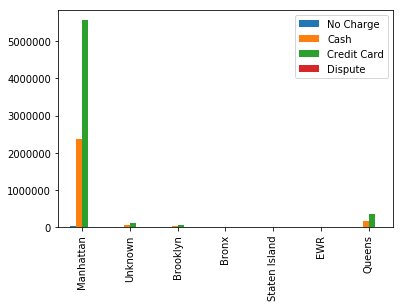

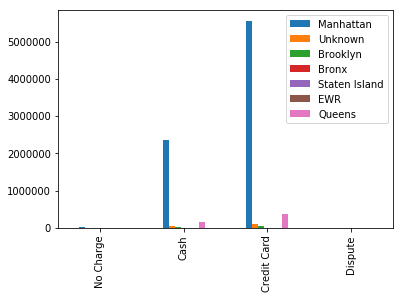

In [18]:
df42.plot(kind='bar')
df42.T.plot(kind = 'bar')

### $\chi^2$ Test:

We used a build function of the scipy library for computing the statistical test.

In [19]:
stat.chi2_contingency(df42)

(14463.192599649135,
 0.0,
 18,
 array([[3.92871213e+04, 2.36332622e+06, 5.55231216e+06, 1.07774966e+04],
        [7.83754520e+02, 4.71469415e+04, 1.10765299e+05, 2.15004596e+02],
        [4.94436450e+02, 2.97429434e+04, 6.98769831e+04, 1.35636997e+02],
        [3.64428023e+01, 2.19222553e+03, 5.15033445e+03, 9.99722462e+00],
        [7.10212955e-01, 4.27230309e+01, 1.00371926e+02, 1.94830200e-01],
        [2.81619165e+00, 1.69408685e+02, 3.98002567e+02, 7.72555861e-01],
        [2.59871852e+03, 1.56326537e+05, 3.67267847e+05, 7.12897230e+02]]))

## Conclusions for RQ4

According to the theory of the $\chi^2$ test theory, the null hypothesis is accepted and the test says that the payment method is hightly correlated with the borough. <br>
The most common way to pay a taxi in New York is with the credit card, at the second place there's the cash.
<br>
There are three boroughs without enough data to see in the plot what's happening, and they are: "EWR, "Staten Island" and "Bronx".

In [20]:
del df4
del df42

# RQ5

*Does a long distance correlate with the duration of the trip on average?* Make a plot that show the dependence between distance and duration of the trip. Then compute the [Pearson Coefficient](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient), is it significant? Comment the results you obtain.


In [52]:
df5 = df[['tpep_pickup_datetime','tpep_dropoff_datetime','trip_distance']]
display(df5.head())
display(df5.info(null_counts=True)) #Checking the NaN values

,tpep_pickup_datetime,tpep_dropoff_datetime,trip_distance
0,2018-01-01 00:21:05,2018-01-01 00:24:23,0.50
1,2018-01-01 00:49:32,2018-01-01 00:59:52,1.36
2,2018-01-01 00:11:56,2018-01-01 00:14:35,0.30
3,2018-01-01 00:58:32,2018-01-01 01:43:45,14.10
4,2018-01-01 00:14:09,2018-01-01 00:44:06,8.77


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8759874 entries, 0 to 8759873
Data columns (total 3 columns):
tpep_pickup_datetime     8759874 non-null datetime64[ns]
tpep_dropoff_datetime    8759874 non-null datetime64[ns]
trip_distance            8759874 non-null float64
dtypes: datetime64[ns](2), float64(1)
memory usage: 267.3 MB


None

Cleanup those rows that are included in zero values of 'trip_distance', this is for avoid outliers.

In [54]:
df5=df5[(df5.trip_distance > 0) & (df5.trip_distance < 100) ]

Compute the trip duration, the column '__duration__' has the trip duration in hours. We saw that with the duration in hours the data is better distributed.

In [55]:
#pickup = pd.to_datetime(df['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S')
#dropoff = pd.to_datetime(df['tpep_dropoff_datetime'], format='%Y-%m-%d %H:%M:%S')

df5['duration']= ((df5['tpep_dropoff_datetime'] - df5['tpep_pickup_datetime']).dt.seconds / 3600) #df.apply(getRowDuration, axis=1)

After we have calculated the trip duration in hours we want to plot the dependency between '__trip distance__' and '__duration__'

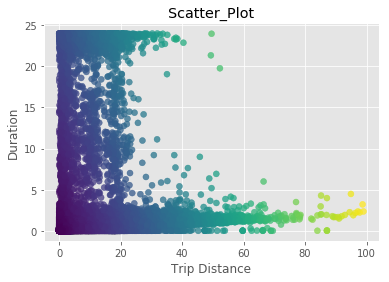

In [56]:
plt.scatter(x = df5['trip_distance'], y = df5['duration'], c = df5['trip_distance'] + df5['duration'], alpha= 0.75)
plt.xlabel("Trip Distance")
plt.ylabel("Duration")
plt.title("Scatter_Plot")
plt.show()

As requested, we want to calculate the Pearson correlation coefficient and we used 
[pearsonr](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.pearsonr.html).


In [57]:
corr, p_value = pearsonr(df5['trip_distance'], df5['duration'])
print ("The Pearson correlation coefficient calculated with scipy is: " + str("%0.2f"%corr))
print ("The Pearson correlation coefficient calculated with pandas is: " + str("%0.2f"%df5['trip_distance'].corr(df5['duration'])))

The Pearson correlation coefficient calculated with scipy is: 0.15
The Pearson correlation coefficient calculated with pandas is: 0.15


It seems that the correlation between the trip distance and the duration in hour of the trip is going to zero, this means that the two variables are uncorrelated

## Extra: WE GO POLAR

In [58]:
def cart2pol(x,y):
    rho = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y,x)
    return (rho,theta)

In [59]:
[rho, theta] = cart2pol(df5['trip_distance'], df5['duration'])

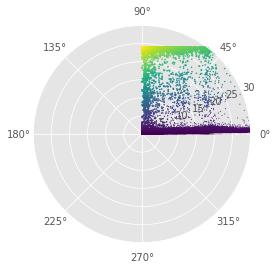

In [60]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='polar')
ax.scatter(theta, rho, c=rho*theta, s=theta) #s=rho**2
ax.set_rmax(30)
ax.set_rmin(0)
#ax.set_rticks([0.5, 1, 1.5, 2])
plt.show()

In [61]:
del df5

## CRQ1

1.  *Does the fare for mile change across NY's borough?* We want to discover whether the expenses of a user that enjoys Taxis in one zone is different from those that uses it in another one.
    * Considering the fare amount:
		- Compute the price per mile $P$ for each trip.
        - Run the mean and the standard deviation of the new variable for each borough. Then plot the distribution. What do you see?
        - Run the t-test among all the possible pairs of distribution of different boroughs.
        - Can you say that statistically significant differences, on the averages, hold among zones? In other words, are Taxis trip in some boroughs, on average, more expensive than others? 
    * The price per mile might depend on traffic the Taxi finds on its way. So we try to mitigate this effect:
        - Likely, the duration of the trip says something about the city's congestion, especially if combined with the distances. It might be a good idea to weight the price for mile using the time $T$ needed to complete the trip. Thus, instead of $P$, you can use $P' ~= ~\frac{P}{T}$, where $T$ is the time needed to complete the trip.
        - Run the mean and the standard deviation of the new variable for each borough. Then plot the distribution. What do you see?
        - Run the t-test among all the possible pairs of new distribution of different boroughs.
        - Can you say that statistically significant differences, on the averages, hold among zones? In other words, are Taxis trip in some boroughs, on average, more expensive than others?            
    * Compare the results obtained for the price per mile and the weighted price for mile. What do you think about that?
    


## References
https://en.wikipedia.org/wiki/Taxicabs_of_New_York_City <br>
http://cs229.stanford.edu/proj2016/report/AntoniadesFadaviFobaAmonJuniorNewYorkCityCabPricing-report.pdf <br>
https://www.kaggle.com/selfishgene/yellow-cabs-tell-the-story-of-new-york-city <br>

### HPs:

In this request we have to discover if the price per mile is related to the borough, in this specific section we have only the price per mile, in the next one we will add the time trip as a variable of interest, in order to improve performances we load the entire data in the next chunk. In the next section we will crop the outliers and the useless data.

In [85]:
dfcrq1 = df[['trip_distance', 'fare_amount', 'LocationID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime']].fillna(0)
     
#after the nested loop i have to perform some manipulations in order to have the complete the dataframe 
zone_lookup = pd.read_csv("/Users/ince/Desktop/uni/adm/hws/hw2/taxi_zone_lookup.csv") # this dataset have a map between the LocationID and Borough
dfcrq1 = dfcrq1.merge(zone_lookup[['LocationID', 'Borough']], how='inner' ,on='LocationID').fillna(0) #Inner join between the interested columns and the previous dataset
dfcrq1 = dfcrq1.loc[(dfcrq1['trip_distance'] > 0) & #removing the < 0 mile-distance records
                    (dfcrq1['fare_amount'] > 0) & 
                    (dfcrq1['tpep_pickup_datetime'].dt.year == 2018) &
                    (dfcrq1['tpep_dropoff_datetime'].dt.year == 2018) &
                    (dfcrq1['trip_distance'] < 100)].reset_index() #removing the > 100 mile-distance records

dfcrq1 = dfcrq1.drop(['LocationID', 'index'], axis=1) #drop useless columns

dfcrq1['$/mile'] = dfcrq1['fare_amount'] / dfcrq1['trip_distance'] #calc the dollar per mile amount
dfcrq1['Deltatime'] = ((dfcrq1['tpep_dropoff_datetime']-dfcrq1['tpep_pickup_datetime']).dt.seconds)/60
dfcrq1['$*minutes/mile'] = dfcrq1['$/mile']*dfcrq1['Deltatime']
display(dfcrq1.head())
display(dfcrq1.info())
display(dfcrq1.describe())

,trip_distance,fare_amount,tpep_pickup_datetime,tpep_dropoff_datetime,Borough,$/mile,Deltatime
0,0.50,4.5,2018-01-01 00:21:05,2018-01-01 00:24:23,Manhattan,9.000000,3.300000
1,1.36,8.5,2018-01-01 00:49:32,2018-01-01 00:59:52,Manhattan,6.250000,10.333333
2,0.30,4.0,2018-01-01 00:11:56,2018-01-01 00:14:35,Manhattan,13.333333,2.650000
3,14.10,41.5,2018-01-01 00:58:32,2018-01-01 01:43:45,Manhattan,2.943262,45.216667
4,8.77,29.0,2018-01-01 00:14:09,2018-01-01 00:44:06,Manhattan,3.306727,29.950000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8699706 entries, 0 to 8699705
Data columns (total 7 columns):
trip_distance            float64
fare_amount              float64
tpep_pickup_datetime     datetime64[ns]
tpep_dropoff_datetime    datetime64[ns]
Borough                  object
$/mile                   float64
Deltatime                float64
dtypes: datetime64[ns](2), float64(4), object(1)
memory usage: 464.6+ MB


None

,trip_distance,fare_amount,$/mile,Deltatime
count,8.699706e+06,8.699706e+06,8.699706e+06,8.699706e+06
mean,2.800012e+00,1.219017e+01,7.012991e+00,1.573102e+01
std,3.620786e+00,1.103316e+01,6.131500e+01,6.020900e+01
min,1.000000e-02,1.000000e-02,1.915709e-04,0.000000e+00
25%,9.300000e-01,6.500000e+00,4.347826e+00,6.316667e+00
50%,1.570000e+00,9.000000e+00,5.517241e+00,1.043333e+01
75%,2.870000e+00,1.350000e+01,7.000000e+00,1.690000e+01
max,9.870000e+01,8.016000e+03,3.750000e+04,1.439983e+03


The resulting dataframe has all the data for this request and for the next one, the last two columns are useful only in the next section in which we have to consider the trip time. As we can se there are some data that are kind of "noise", despues we try to remove the noise as better as possible.

## $\mu$ and $\sigma$ for the entire city

These values will be necessary when we have to consider the correlation between the entire city and the specific borough.

In [86]:
new_york_dollar_per_mile_mean = dfcrq1['$/mile'].mean()
new_york_dollar_per_mile_std = dfcrq1['$/mile'].std()

## Plotting the distribution
As a request of this exercise, we plot the distribution of the random variable P = Fare_amout / mile, we expect that this is like a Cumbell or $\chi^2$ distribution.
We also

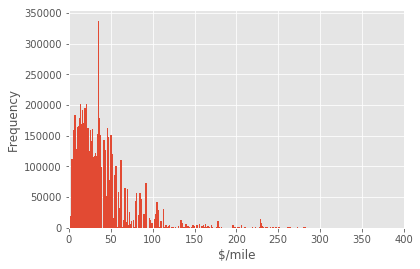

In [87]:
labels, values = zip(*Counter(dfcrq1['$/mile'].round(decimals=1)).items())

indexes = np.arange(len(labels))
width = 1.7
plt.xlim(0,400)

plt.bar(indexes, values, width)
plt.xlabel('$/mile')
plt.ylabel('Frequency')
plt.show()

### Considerations

We see that in the distribution there's some outlier, in the next section we want to evaluate if they're really outliers or maybe some traffic issues. Also the distribution is not Gaussian so in theory we cannot run the t-test on this data.

## Plot for $\mu$ and $\sigma$ for every borough

In [88]:
mean = dfcrq1.groupby('Borough').mean()['$/mile'] #this groups by borough, calc the mean and takes only the column that i want to plot
std = dfcrq1.groupby('Borough').std()['$/mile'] #same as above, but for the standard deviaton
dfcrq12 = pd.DataFrame([mean, std], columns=[el for el in set(dfcrq1['Borough'])],  index=['mean', 'std']) #combine the previous result in a dataframe
dfcrq12['NY'] = pd.Series([new_york_dollar_per_mile_mean, new_york_dollar_per_mile_std], index = ['mean', 'std'])
display(dfcrq12)

,Manhattan,Unknown,Brooklyn,Bronx,Staten Island,EWR,Queens,NY
mean,6.754276,21.654866,6.509263,8.894158,14.161235,662.361034,6.629768,7.012991
std,42.021511,288.947405,79.319419,70.662113,61.423870,1753.322553,98.853992,61.315003


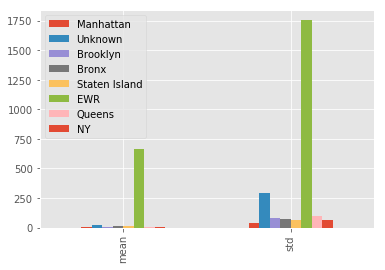

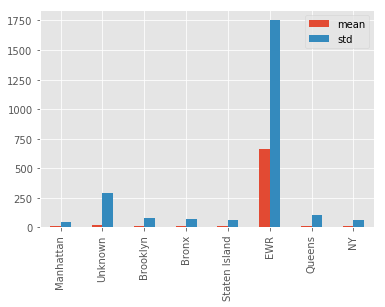

In [89]:
dfcrq12.plot(kind='bar')
dfcrq12.T.plot(kind='bar')

It's alway interesting to plot the dataframe and the transpose of it, so you can have a complete overwiev of what's happening.

## Ttest and p-value

The variables are related, but the samples aren't a function of the other so scipy.stat.ttest_ind works well for our purposes

In [90]:
dfcrq13 = pd.DataFrame()
combs = list(it.combinations(set(dfcrq1['Borough']), 2))
for b1,b2 in combs:
    ttest_result = stat.ttest_ind(dfcrq1.loc[dfcrq1['Borough'] == b1]['$/mile'], dfcrq1.loc[df['Borough'] == b2]['$/mile'])
    dfcrq13[b1+'-'+b2] = pd.Series([ttest_result[0], ttest_result[1]], index=['ttest', 'pval'])
display(dfcrq13)

,Manhattan-Unknown,Manhattan-Brooklyn,Manhattan-Bronx,Manhattan-Staten Island,Manhattan-EWR,Manhattan-Queens,Unknown-Brooklyn,Unknown-Bronx,Unknown-Staten Island,Unknown-EWR,...,Brooklyn-Bronx,Brooklyn-Staten Island,Brooklyn-EWR,Brooklyn-Queens,Bronx-Staten Island,Bronx-EWR,Bronx-Queens,Staten Island-EWR,Staten Island-Queens,EWR-Queens
ttest,-77.351815,-1.292154e+01,1.041321,NaN,NaN,-5.046204e+00,1.156901e+01,2.405723,NaN,NaN,...,0.416544,NaN,NaN,-1.708898,NaN,NaN,1.402240,NaN,0.707073,78.077298
pval,0.000000,3.405407e-38,0.297726,NaN,NaN,4.506829e-07,6.038924e-31,0.016142,NaN,NaN,...,0.677013,NaN,NaN,0.087470,NaN,NaN,0.160844,NaN,0.479521,0.000000


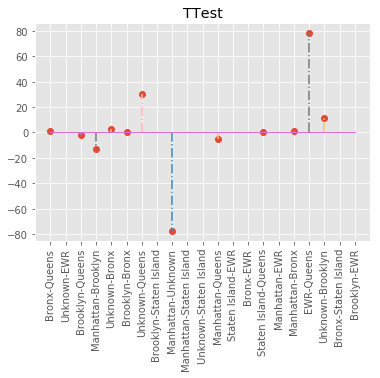

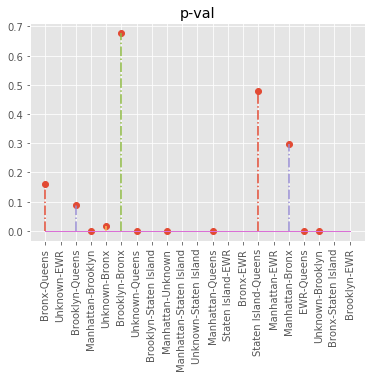

In [91]:
x = range(len(set(dfcrq13)))
x_labels = set(dfcrq13)
y = [dfcrq13[i][0] for i in x_labels]

markerline, stemlines, baseline = plt.stem(x,y, '-.')
plt.setp(baseline, color='orchid', linewidth=1)
plt.title('TTest')
plt.xticks(x, x_labels, rotation='vertical')
plt.show()

y = [dfcrq13[i][1] for i in x_labels]

markerline, stemlines, baseline = plt.stem(x,y, '-.')
plt.setp(baseline, color='orchid', linewidth=1)
plt.title('p-val')
plt.xticks(x, x_labels, rotation='vertical')
plt.show()

In [92]:
del dfcrq12
del dfcrq13

# Second request

For our purposes, we have to cleanup the data. So for hypotesis we crop all the trips that lasts more than 2 hours.

In [94]:
dfcrq1 = dfcrq1.loc[dfcrq1['Deltatime'] < 120]

## Plot the distribution of the rescaled variable

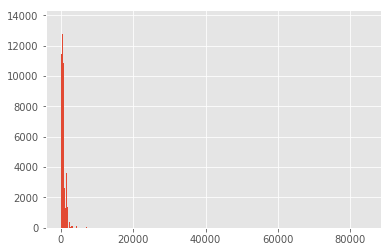

In [96]:
labels, values = zip(*Counter(dfcrq1['$*minutes/mile'].round(decimals=0)).items())

indexes = np.arange(len(labels))
width = 2
plt.xlim(0,400)
plt.bar(indexes, values, width)
plt.xlabel("$*minutes/mile")
plt.ylabel("Frequecy")
plt.show()

## Compute $\mu$ and $\sigma$ for the city of New York and for every borough

In [99]:
dfcrq1['$*minutes/mile'] = df['$*minutes/mile']

In [100]:
new_york_dollar_per_mile_mean = dfcrq1['$*minutes/mile'].mean()
new_york_dollar_per_mile_std = dfcrq1['$*minutes/mile'].std()

mean = dfcrq1.groupby('Borough').mean()['$*minutes/mile'] #this groups by borough, calc the mean and takes only the column that i want to plot
std = dfcrq1.groupby('Borough').std()['$*minutes/mile'] #same as above, but for the standard deviaton

dfcrq12 = pd.DataFrame([mean, std], columns=[el for el in set(dfcrq1['Borough'])],  index=['mean', 'std']) #combine the previous result in a dataframe
dfcrq12['NY'] = pd.Series([new_york_dollar_per_mile_mean, new_york_dollar_per_mile_std], index = ['mean', 'std'])
display(dfcrq12)

,Manhattan,Unknown,Brooklyn,Bronx,Staten Island,EWR,Queens,NY
mean,68.294523,73.162449,65.051327,67.700573,65.01012,240.962369,102.626631,70.369772
std,494.874411,285.157635,350.009173,89.893445,86.78564,823.410531,675.521810,503.079603


## Plotting the mean and the standard deviation of NY and for boroughs

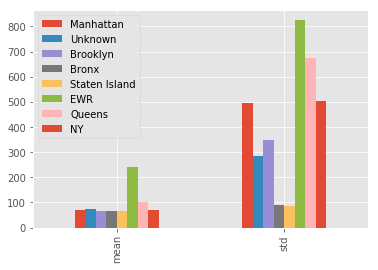

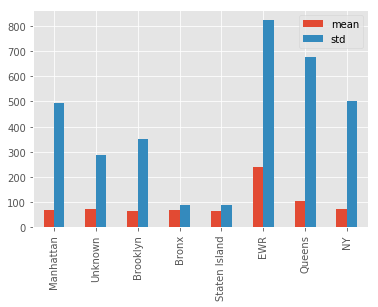

In [101]:
dfcrq12.plot(kind='bar')
dfcrq12.T.plot(kind='bar')

## Compute the statistical test for every combination of boroughs

In [102]:
dfcrq13 = pd.DataFrame()
combs = list(it.combinations(set(dfcrq1['Borough']), 2))
for b1,b2 in combs:
    ttest_result = stat.ttest_ind(dfcrq1.loc[dfcrq1['Borough'] == b1]['$*minutes/mile'], dfcrq1.loc[df['Borough'] == b2]['$*minutes/mile'])
    dfcrq13[b1+'-'+b2] = pd.Series([ttest_result[0], ttest_result[1]], index=['ttest', 'pval'])
display(dfcrq13)

,Manhattan-Unknown,Manhattan-Brooklyn,Manhattan-Bronx,Manhattan-Staten Island,Manhattan-EWR,Manhattan-Queens,Unknown-Brooklyn,Unknown-Bronx,Unknown-Staten Island,Unknown-EWR,...,Brooklyn-Bronx,Brooklyn-Staten Island,Brooklyn-EWR,Brooklyn-Queens,Bronx-Staten Island,Bronx-EWR,Bronx-Queens,Staten Island-EWR,Staten Island-Queens,EWR-Queens
ttest,-1.167967e+01,-2.984305,1.902823,NaN,NaN,-43.085817,-0.438189,4.047609,NaN,NaN,...,2.285245,NaN,NaN,-1.889391e+01,NaN,NaN,-4.701765,NaN,-0.648804,3.324695
pval,1.620212e-31,0.002842,0.057064,NaN,NaN,0.000000,0.661250,0.000052,NaN,NaN,...,0.022301,NaN,NaN,1.349895e-79,NaN,NaN,0.000003,NaN,0.516465,0.000885


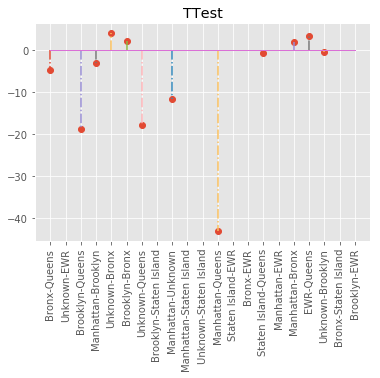

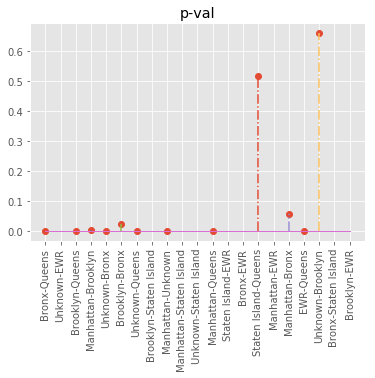

In [103]:
x = range(len(set(dfcrq13)))
x_labels = set(dfcrq13)
y = [dfcrq13[i][0] for i in x_labels]

markerline, stemlines, baseline = plt.stem(x,y, '-.')
plt.setp(baseline, color='orchid', linewidth=1)
plt.title('TTest')
plt.xticks(x, x_labels, rotation='vertical')
plt.show()

y = [dfcrq13[i][1] for i in x_labels]

markerline, stemlines, baseline = plt.stem(x,y, '-.')
plt.setp(baseline, color='orchid', linewidth=1)
plt.title('p-val')
plt.xticks(x, x_labels, rotation='vertical')
plt.show()

# Conclusions for CRQ1

pampero

In [104]:
del dfcrq1
del dfcrq12
del dfcrq13

# CRQ2
2. *Visualize Taxis movements!* NYC is divided in many Taxis zones. For each yellow cab trip we know the zone the Taxi pick up and drop off the users. Let's visualize, on a [chropleth map](https://en.wikipedia.org/wiki/Choropleth_map), the number of trips that starts in each zone. Than, do another map to count the races that end up in the single zone. Comment your discoveries. To perform this task we use the library [`folium`](https://github.com/python-visualization/folium). You find some examples of chorophlet maps [here](https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/Colormaps.ipynb) and [__here__](https://medium.com/@austinlasseter/using-folium-to-generate-a-simple-map-of-your-pandas-data-87ddc5d55f8d). The `Geojson` we use to trace the zones is `taxi_zones.json` in the Homework's repository.


### Loading Data

**Variables explaination**: <br>
*df* : contains two columns, PULocationID and DOLocationID, respectively: the location id for the pickup and the dropoff of the trip record, this DataFrame is the core for the next steps. <br>
*geo_data* : contains the data for tracing the taxis zones

In [106]:
dfcrq2 = df[['LocationID', 'DOLocationID']]
geo_data = json.load(open('/Users/ince/Desktop/uni/adm/hws/hw2/taxi_zones.json'))
display(dfcrq2.head())

,LocationID,DOLocationID
0,41,24
1,41,74
2,41,41
3,41,112
4,41,223


Now we create a simple map with the coordinates of New York, as expected it's empty: in the next chunks we fill it with data.

In [107]:
NY=folium.Map(
    location=[40.7142700, -74.0059700],   #coordinates of new York
    zoom_start=11,                        
    tiles='CartoDB positron'              #style of our map
)
NY

The previous map is completely blank. We have to fill it with the GeoJson data for the zones covered by taxis.<br>
We want to show only the zone were data were registered.

In [108]:
folium.GeoJson(
    geo_data,
    style_function=lambda feature: {
        'fillColor':'blue',
        'color' : 'orchid',
        'weight' : 1,
        'fillOpacity' : 0.5,
        'colorOpacity' : 0.5
    }
).add_to(NY)
NY

### Data Egnineering

The next chunk will fill two lists with as index the number of the zone and as value the count of taxis registered in that zone for the pickup or for the dropoff. 

After the algorithm has filled the list, we merge the result into a single dataFrame for improve the readability

In [110]:
location_id_to_number_of_pickups=dfcrq2.groupby('LocationID')['LocationID'].count()
location_id_to_number_of_dropoff=dfcrq2.groupby('DOLocationID')['DOLocationID'].count()

location_id_to_number_of_pickups.head()

df_zone_to_pickup_to_dropoff=pd.DataFrame(index=list(range(1,266)),columns=[])
df_zone_to_pickup_to_dropoff['ZoneID']=list(range(1,266))

zone_index_to_dropoff_number = []
zone_index_to_pickup_number = []

for i in range(1,266):
    if i in location_id_to_number_of_pickups:
        zone_index_to_pickup_number.append(location_id_to_number_of_pickups[i])
    else:
        zone_index_to_pickup_number.append(0)    
        
    if i in location_id_to_number_of_dropoff:
        zone_index_to_dropoff_number.append(location_id_to_number_of_dropoff[i])
    else:
        zone_index_to_dropoff_number.append(0)     #we need to do this check becouse some zones are missing (maybe 0 taxi taken in that zone)

df_zone_to_pickup_to_dropoff['taxi_pickups'] = zone_index_to_pickup_number
df_zone_to_pickup_to_dropoff['taxi_dropoff'] = zone_index_to_dropoff_number
display(df_zone_to_pickup_to_dropoff.head())

,ZoneID,taxi_pickups,taxi_dropoff
1,1,571,14042
2,2,4,5
3,3,37,515
4,4,19656,42567
5,5,2,55


## Pickups map:

We want to show the density of the pickups with resepect to the points of interest

In [111]:
NY2 = folium.Map(
    location=[40.7142700, -74.0059700],   #coordinates of new York
    zoom_start=11,                        
    tiles='CartoDB positron'              #style of our map
)

NY2.choropleth(
    geo_data=geo_data,  #our geojson datas
    data=df_zone_to_pickup_to_dropoff,    #our dataframe
    columns=['ZoneID', 'taxi_pickups'],
    key_on='feature.properties.LocationID', #the key in geojson file that way want to take as zone
    fill_color='YlGnBu',   #the color scale that we want
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of taxi taken in 2018',
    highlight=True    #enable the highlight function, to enable highlight functionality when you hover over each area.
)

folium.Marker(
    location=[40.7730135746, -73.8702298524],
    popup='Airport LaGuardia',
    icon=folium.Icon(icon='plane')
).add_to(NY2)

folium.Marker(
    location=[40.6413111, -73.7781391],
    popup='John F. Kennedy International Airport',
    icon=folium.Icon(icon='plane')
).add_to(NY2)

folium.Marker(
    location=[40.7828647, -73.9653551],
    popup = 'Central Park',
    icon=folium.Icon(color='red')
).add_to(NY2)

folium.Marker(
    location=[40.758895, -73.985131],
    popup = 'Times Square',
    icon=folium.Icon(color='red')
).add_to(NY2)

folium.Marker(
    location=[40.7061927, -74.0091604],
    popup = 'Wall Street',
    icon=folium.Icon(color='red')
).add_to(NY2)

folium.Marker(
    location=[40.692013, -74.181557],
    popup='Newark Liberty International Airport',
    icon=folium.Icon(icon='plane')
).add_to(NY2)

NY2

### Considerations:

As expected saw that near the airports and in the center of Manhattan there are many pickups.

## Dropoff Map:

We want to show the same map as showed before but for the dropoffs

In [112]:
NY3 = folium.Map(
    location=[40.7142700, -74.0059700],   #coordinates of new York
    zoom_start=11,                        
    tiles='CartoDB positron'              #style of our map
)

NY3.choropleth(
    geo_data=geo_data,
    data=df_zone_to_pickup_to_dropoff,
    columns=['ZoneID', 'taxi_dropoff'],
    key_on='feature.properties.LocationID',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of taxi drops in 2018',
    highlight=True    
)
folium.Marker(
    location=[40.7730135746, -73.8702298524],
    popup='LaGuardia Airport',
    icon=folium.Icon(icon='plane')
).add_to(NY3)

folium.Marker(
    location=[40.6413111, -73.7781391],
    popup='John F. Kennedy International Airport',
    icon=folium.Icon(icon='plane')
).add_to(NY3)

folium.Marker(
    location=[40.7828647, -73.9653551],
    popup = 'Central Park',
    icon=folium.Icon(color='red')
).add_to(NY3)

folium.Marker(
    location=[40.758895, -73.985131],
    popup = 'Times Square',
    icon=folium.Icon(color='red')
).add_to(NY3)

folium.Marker(
    location=[40.7061927, -74.0091604],
    popup = 'Wall Street',
    icon=folium.Icon(color='red')
).add_to(NY3)

folium.Marker(
    location=[40.692013, -74.181557],
    popup='Newark Liberty International Airport',
    icon=folium.Icon(icon='plane')
).add_to(NY3)

NY3

## Considerations:

As unexpected, the dropoff in the airports are lesser than the pickups, maybe this happens because in New York the population is goind to increase and the persons arrives for remain in New York [proof](http://worldpopulationreview.com/states/new-york-population/).


Moreover, the dropoffs outside the center of New York are higher than the pickups, this might be happen because in the night the guys prefer to take the taxis to go back home instead of the car.